# 2026-02-24
WESAD wrist sensors: baseline vs stress vs amusement (15 subjects)

In [1]:
import pickle
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("seaborn-v0_8-whitegrid")

WESAD_ROOT = Path(r"C:\Users\mbnv6\Project\Dataset\WESAD")
TARGET_SUBJECTS = [
    "S2", "S3", "S4", "S5", "S6",
    "S7", "S8", "S9", "S10", "S11",
    "S13", "S14", "S15", "S16", "S17",
]

STATE_NAMES = {1: "Baseline", 2: "Stress", 3: "Amusement"}
STATE_COLORS = {1: "#2ecc71", 2: "#e74c3c", 3: "#3498db"}


def downsample_wrist(wrist):
    bvp = wrist["BVP"].reshape(-1)
    acc = wrist["ACC"]
    eda = wrist["EDA"].reshape(-1)
    temp = wrist["TEMP"].reshape(-1)

    # Original sampling rates: BVP=64Hz, ACC=32Hz, EDA=4Hz, TEMP=4Hz
    return bvp[::64], acc[::32], eda[::4], temp[::4]


def downsample_labels_1hz(labels):
    # Labels are sampled at 700Hz in WESAD
    return labels[::700].reshape(-1)


def add_stimulus_background(ax, labels_1hz, time_min):
    if len(labels_1hz) == 0:
        return

    step = (time_min[1] - time_min[0]) if len(time_min) > 1 else 1.0 / 60.0
    start = 0
    for i in range(1, len(labels_1hz) + 1):
        if i == len(labels_1hz) or labels_1hz[i] != labels_1hz[start]:
            label = int(labels_1hz[start])
            if label in STATE_COLORS:
                ax.axvspan(
                    time_min[start],
                    time_min[i - 1] + step,
                    color=STATE_COLORS[label],
                    alpha=0.12,
                    label=STATE_NAMES[label],
                )
            start = i


def downsample_chest(chest):
    acc = chest["ACC"]
    ecg = chest["ECG"].reshape(-1)
    emg = chest["EMG"].reshape(-1)
    temp = chest["Temp"].reshape(-1)

    # Original sampling rates: ECG=700Hz, EMG=700Hz, ACC=32Hz, Temp=4Hz
    return acc[::32], ecg[::700], emg[::700], temp[::4]


def plot_subject_wrist(subject_id):
    pkl_path = WESAD_ROOT / subject_id / f"{subject_id}.pkl"
    if not pkl_path.exists():
        print(f"Missing subject file: {pkl_path}")
        return

    with open(pkl_path, "rb") as f:
        data = pickle.load(f, encoding="latin1")

    wrist = data["signal"]["wrist"]
    labels = data["label"].reshape(-1)

    bvp_ds, acc_ds, eda_ds, temp_ds = downsample_wrist(wrist)
    labels_1hz = downsample_labels_1hz(labels)

    def trim_to_labels(sensor):
        n = min(len(sensor), len(labels_1hz))
        return sensor[:n], labels_1hz[:n]

    bvp_ds, labels_bvp = trim_to_labels(bvp_ds)
    acc_ds, labels_acc = trim_to_labels(acc_ds)
    eda_ds, labels_eda = trim_to_labels(eda_ds)
    temp_ds, labels_temp = trim_to_labels(temp_ds)

    time_bvp_min = np.arange(len(bvp_ds)) / 60.0
    time_acc_min = np.arange(len(acc_ds)) / 60.0
    time_eda_min = np.arange(len(eda_ds)) / 60.0
    time_temp_min = np.arange(len(temp_ds)) / 60.0

    fig, axes = plt.subplots(4, 1, figsize=(20, 12))
    fig.suptitle(
        f"{subject_id} Wrist Sensors (1Hz) with Stimulus Timeline",
        fontsize=14,
        fontweight="bold",
    )

    add_stimulus_background(axes[0], labels_bvp, time_bvp_min)
    axes[0].plot(time_bvp_min, bvp_ds, linewidth=0.5, color="darkred", alpha=0.8)
    axes[0].set_title("BVP (Blood Volume Pulse)")
    axes[0].set_ylabel("Amplitude")
    axes[0].grid(True, alpha=0.3)
    handles, labels_legend = axes[0].get_legend_handles_labels()
    if handles:
        by_label = dict(zip(labels_legend, handles))
        axes[0].legend(by_label.values(), by_label.keys(), loc="upper right", fontsize=9, ncol=3)

    add_stimulus_background(axes[1], labels_acc, time_acc_min)
    axes[1].plot(time_acc_min, acc_ds[:, 0], label="X-axis", linewidth=0.5, alpha=0.7)
    axes[1].plot(time_acc_min, acc_ds[:, 1], label="Y-axis", linewidth=0.5, alpha=0.7)
    axes[1].plot(time_acc_min, acc_ds[:, 2], label="Z-axis", linewidth=0.5, alpha=0.7)
    axes[1].set_title("ACC (Accelerometer 3-axis)")
    axes[1].set_ylabel("Acceleration")
    axes[1].legend(loc="upper right", fontsize=9, ncol=3)
    axes[1].grid(True, alpha=0.3)

    add_stimulus_background(axes[2], labels_eda, time_eda_min)
    axes[2].plot(time_eda_min, eda_ds, linewidth=1, color="darkgreen", alpha=0.8)
    axes[2].set_title("EDA (Electrodermal Activity)")
    axes[2].set_ylabel("uS")
    axes[2].grid(True, alpha=0.3)

    add_stimulus_background(axes[3], labels_temp, time_temp_min)
    axes[3].plot(time_temp_min, temp_ds, linewidth=1, color="darkorange", alpha=0.8)
    axes[3].set_title("TEMP (Skin Temperature)")
    axes[3].set_ylabel("C")
    axes[3].set_xlabel("Time (minutes)")
    axes[3].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print("Color legend: Baseline=green, Stress=red, Amusement=blue")


def plot_subject_chest(subject_id):
    pkl_path = WESAD_ROOT / subject_id / f"{subject_id}.pkl"
    if not pkl_path.exists():
        print(f"Missing subject file: {pkl_path}")
        return

    with open(pkl_path, "rb") as f:
        data = pickle.load(f, encoding="latin1")

    chest = data["signal"]["chest"]
    labels = data["label"].reshape(-1)

    acc_ds, ecg_ds, emg_ds, temp_ds = downsample_chest(chest)
    labels_1hz = downsample_labels_1hz(labels)

    def trim_to_labels(sensor):
        n = min(len(sensor), len(labels_1hz))
        return sensor[:n], labels_1hz[:n]

    acc_ds, labels_acc = trim_to_labels(acc_ds)
    ecg_ds, labels_ecg = trim_to_labels(ecg_ds)
    emg_ds, labels_emg = trim_to_labels(emg_ds)
    temp_ds, labels_temp = trim_to_labels(temp_ds)

    time_acc_min = np.arange(len(acc_ds)) / 60.0
    time_ecg_min = np.arange(len(ecg_ds)) / 60.0
    time_emg_min = np.arange(len(emg_ds)) / 60.0
    time_temp_min = np.arange(len(temp_ds)) / 60.0

    fig, axes = plt.subplots(4, 1, figsize=(20, 12))
    fig.suptitle(
        f"{subject_id} Chest Sensors (1Hz) with Stimulus Timeline",
        fontsize=14,
        fontweight="bold",
    )

    add_stimulus_background(axes[0], labels_acc, time_acc_min)
    axes[0].plot(time_acc_min, acc_ds[:, 0], label="X-axis", linewidth=0.5, alpha=0.7)
    axes[0].plot(time_acc_min, acc_ds[:, 1], label="Y-axis", linewidth=0.5, alpha=0.7)
    axes[0].plot(time_acc_min, acc_ds[:, 2], label="Z-axis", linewidth=0.5, alpha=0.7)
    axes[0].set_title("ACC (Accelerometer 3-axis)")
    axes[0].set_ylabel("Acceleration")
    axes[0].legend(loc="upper right", fontsize=9, ncol=3)
    axes[0].grid(True, alpha=0.3)
    handles, labels_legend = axes[0].get_legend_handles_labels()
    if handles:
        by_label = dict(zip(labels_legend, handles))
        axes[0].legend(by_label.values(), by_label.keys(), loc="upper right", fontsize=9, ncol=3)

    add_stimulus_background(axes[1], labels_ecg, time_ecg_min)
    axes[1].plot(time_ecg_min, ecg_ds, linewidth=0.5, color="purple", alpha=0.8)
    axes[1].set_title("ECG (Electrocardiogram)")
    axes[1].set_ylabel("Amplitude")
    axes[1].grid(True, alpha=0.3)

    add_stimulus_background(axes[2], labels_emg, time_emg_min)
    axes[2].plot(time_emg_min, emg_ds, linewidth=0.5, color="brown", alpha=0.8)
    axes[2].set_title("EMG (Electromyography)")
    axes[2].set_ylabel("Amplitude")
    axes[2].grid(True, alpha=0.3)

    add_stimulus_background(axes[3], labels_temp, time_temp_min)
    axes[3].plot(time_temp_min, temp_ds, linewidth=1, color="darkorange", alpha=0.8)
    axes[3].set_title("TEMP (Skin Temperature)")
    axes[3].set_ylabel("C")
    axes[3].set_xlabel("Time (minutes)")
    axes[3].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print("Color legend: Baseline=green, Stress=red, Amusement=blue")

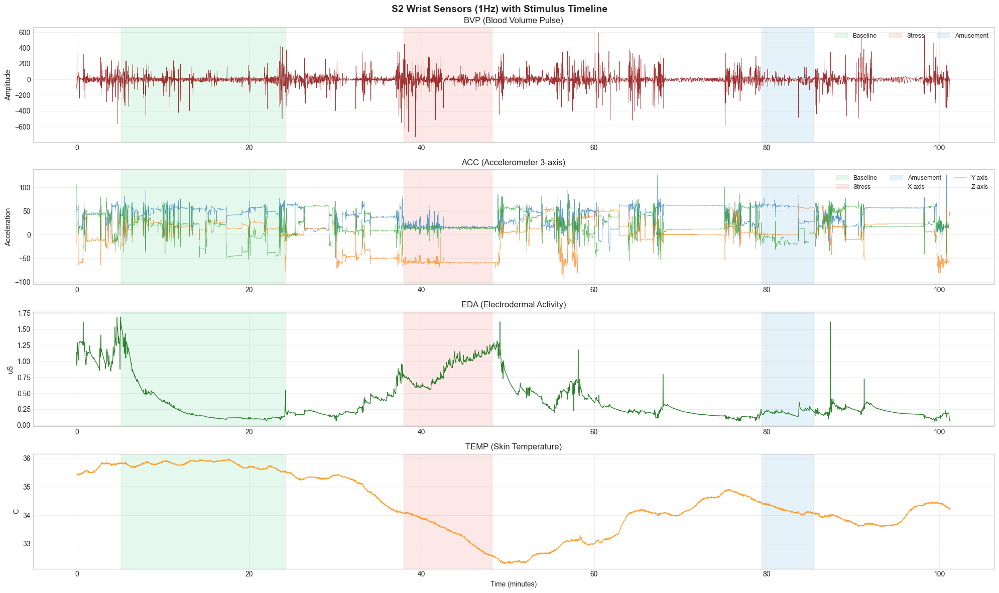

Color legend: Baseline=green, Stress=red, Amusement=blue


In [2]:
plot_subject_wrist("S2")

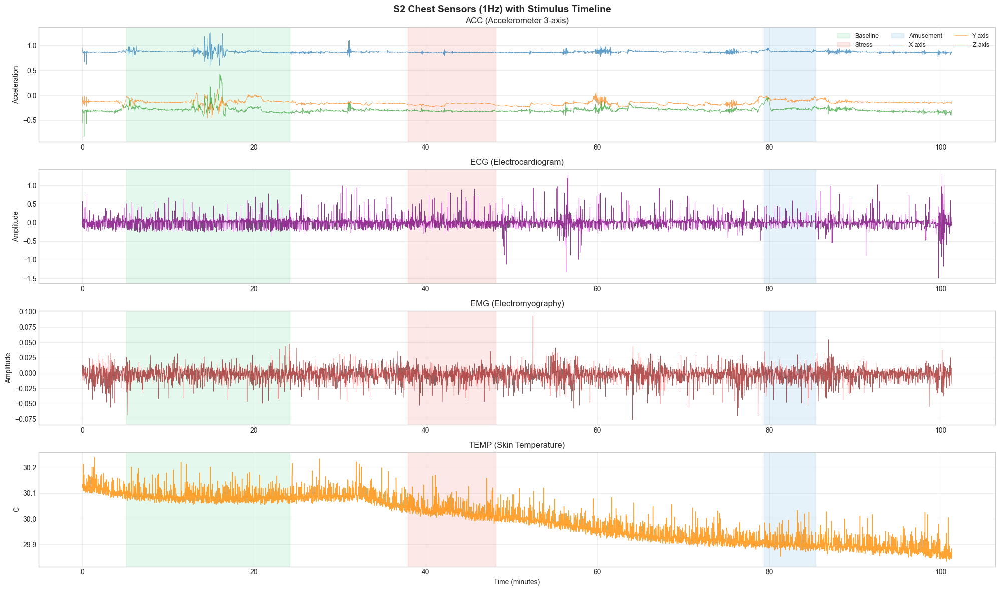

Color legend: Baseline=green, Stress=red, Amusement=blue


In [3]:
plot_subject_chest("S2")

S2 SUBJECT ANALYSIS: Baseline vs Stress vs Amusement

BASELINE:
  BVP:      Mean=-1.1059, Std=66.8785
  ACC-X:    Mean=48.8042
  ACC-Y:    Mean=18.3811
  ACC-Z:    Mean=6.6084
  ACC-Mag:  Mean=63.3429 (Magnitude)
  EDA:      Mean=0.2980, Std=0.3100
  TEMP:     Mean=35.7861
  EMG:      Mean=-0.0025, Std=0.0105

STRESS:
  BVP:      Mean=-2.8914, Std=85.8146
  ACC-X:    Mean=16.9951
  ACC-Y:    Mean=-58.5593
  ACC-Z:    Mean=13.6244
  ACC-Mag:  Mean=62.8428 (Magnitude)
  EDA:      Mean=0.8703, Std=0.2044
  TEMP:     Mean=33.4415
  EMG:      Mean=-0.0034, Std=0.0106

AMUSEMENT:
  BVP:      Mean=-2.9812, Std=45.1636
  ACC-X:    Mean=51.1989
  ACC-Y:    Mean=16.5552
  ACC-Z:    Mean=-8.1602
  ACC-Mag:  Mean=63.3584 (Magnitude)
  EDA:      Mean=0.2062, Std=0.0382
  TEMP:     Mean=34.1906
  EMG:      Mean=-0.0030, Std=0.0113

CHANGE FROM BASELINE (%)

STRESS:
  BVP:      +161.46%
  ACC-Mag:  -0.79%
  EDA:      +192.02%
  TEMP:     -6.55%
  EMG:      +38.97%

AMUSEMENT:
  BVP:      +169.58%
  A

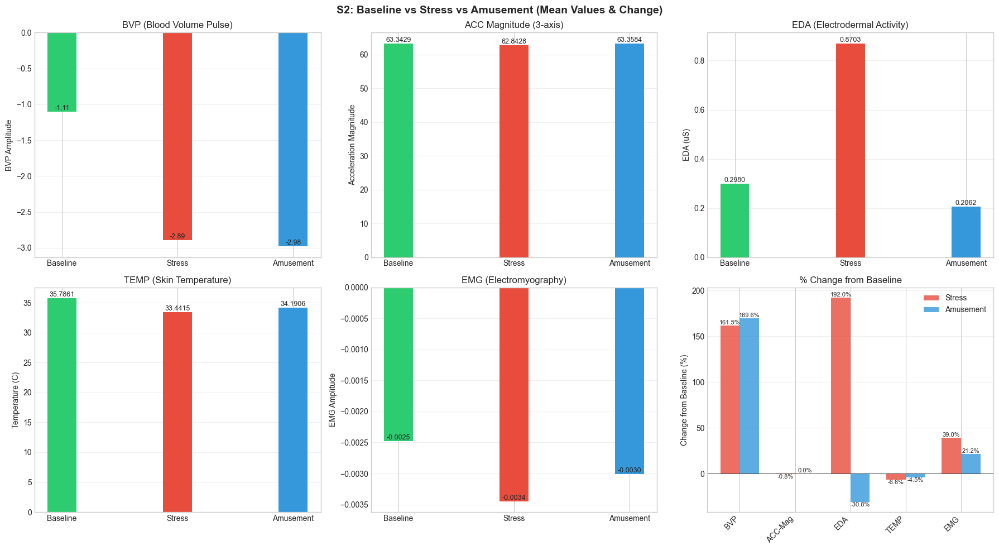

In [ ]:
# S2 Analysis: Baseline vs Stress vs Amusement
import pandas as pd

pkl_path = WESAD_ROOT / "S2" / "S2.pkl"
with open(pkl_path, "rb") as f:
    data = pickle.load(f, encoding="latin1")

wrist = data["signal"]["wrist"]
chest = data["signal"]["chest"]
labels = data["label"].reshape(-1)

# Downsample
bvp_ds, acc_ds, eda_ds, temp_ds = downsample_wrist(wrist)
acc_chest_ds, ecg_ds, emg_ds, temp_chest_ds = downsample_chest(chest)
labels_1hz = downsample_labels_1hz(labels)

# Trim all to same length
min_len = len(labels_1hz)
bvp_ds = bvp_ds[:min_len]
acc_ds = acc_ds[:min_len]
eda_ds = eda_ds[:min_len]
temp_ds = temp_ds[:min_len]
emg_ds = emg_ds[:min_len]

# Calculate statistics per state
states = [1, 2, 3]
state_names = ["Baseline", "Stress", "Amusement"]
colors = ["#2ecc71", "#e74c3c", "#3498db"]

results = {}
for state, state_name in zip(states, state_names):
    mask = labels_1hz == state
    if np.sum(mask) > 0:
        results[state_name] = {
            "BVP_mean": np.mean(bvp_ds[mask]),
            "BVP_std": np.std(bvp_ds[mask]),
            "ACC_X_mean": np.mean(acc_ds[mask, 0]),
            "ACC_Y_mean": np.mean(acc_ds[mask, 1]),
            "ACC_Z_mean": np.mean(acc_ds[mask, 2]),
            "ACC_mag_mean": np.mean(np.sqrt(np.sum(acc_ds[mask]**2, axis=1))),
            "EDA_mean": np.mean(eda_ds[mask]),
            "EDA_std": np.std(eda_ds[mask]),
            "TEMP_mean": np.mean(temp_ds[mask]),
            "EMG_mean": np.mean(emg_ds[mask]),
            "EMG_std": np.std(emg_ds[mask]),
        }

# Print numerical results
print("=" * 80)
print("S2 SUBJECT ANALYSIS: Baseline vs Stress vs Amusement")
print("=" * 80)
for state_name in state_names:
    if state_name in results:
        print(f"\n{state_name.upper()}:")
        print(f"  BVP:      Mean={results[state_name]['BVP_mean']:.4f}, Std={results[state_name]['BVP_std']:.4f}")
        print(f"  ACC-X:    Mean={results[state_name]['ACC_X_mean']:.4f}")
        print(f"  ACC-Y:    Mean={results[state_name]['ACC_Y_mean']:.4f}")
        print(f"  ACC-Z:    Mean={results[state_name]['ACC_Z_mean']:.4f}")
        print(f"  ACC-Mag:  Mean={results[state_name]['ACC_mag_mean']:.4f} (Magnitude)")
        print(f"  EDA:      Mean={results[state_name]['EDA_mean']:.4f}, Std={results[state_name]['EDA_std']:.4f}")
        print(f"  TEMP:     Mean={results[state_name]['TEMP_mean']:.4f}")
        print(f"  EMG:      Mean={results[state_name]['EMG_mean']:.4f}, Std={results[state_name]['EMG_std']:.4f}")

# Calculate change ratios (Baseline as reference)
baseline_vals = results.get("Baseline", {})
print("\n" + "=" * 80)
print("CHANGE FROM BASELINE (%)")
print("=" * 80)

for state_name in ["Stress", "Amusement"]:
    if state_name in results and baseline_vals:
        print(f"\n{state_name.upper()}:")
        bvp_change = ((results[state_name]["BVP_mean"] - baseline_vals["BVP_mean"]) / baseline_vals["BVP_mean"] * 100) if baseline_vals["BVP_mean"] != 0 else 0
        eda_change = ((results[state_name]["EDA_mean"] - baseline_vals["EDA_mean"]) / baseline_vals["EDA_mean"] * 100) if baseline_vals["EDA_mean"] != 0 else 0
        temp_change = ((results[state_name]["TEMP_mean"] - baseline_vals["TEMP_mean"]) / baseline_vals["TEMP_mean"] * 100) if baseline_vals["TEMP_mean"] != 0 else 0
        emg_change = ((results[state_name]["EMG_mean"] - baseline_vals["EMG_mean"]) / baseline_vals["EMG_mean"] * 100) if baseline_vals["EMG_mean"] != 0 else 0
        acc_mag_change = ((results[state_name]["ACC_mag_mean"] - baseline_vals["ACC_mag_mean"]) / baseline_vals["ACC_mag_mean"] * 100) if baseline_vals["ACC_mag_mean"] != 0 else 0
        
        print(f"  BVP:      {bvp_change:+.2f}%")
        print(f"  ACC-Mag:  {acc_mag_change:+.2f}%")
        print(f"  EDA:      {eda_change:+.2f}%")
        print(f"  TEMP:     {temp_change:+.2f}%")
        print(f"  EMG:      {emg_change:+.2f}%")

# Create bar graphs
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle("S2: Baseline vs Stress vs Amusement (Mean Values & Change)", fontsize=14, fontweight="bold")

# Prepare data for plotting
sensors = ["BVP", "ACC-Mag", "EDA", "TEMP", "EMG"]
baseline_data = [
    results["Baseline"]["BVP_mean"],
    results["Baseline"]["ACC_mag_mean"],
    results["Baseline"]["EDA_mean"],
    results["Baseline"]["TEMP_mean"],
    results["Baseline"]["EMG_mean"],
]
stress_data = [
    results["Stress"]["BVP_mean"],
    results["Stress"]["ACC_mag_mean"],
    results["Stress"]["EDA_mean"],
    results["Stress"]["TEMP_mean"],
    results["Stress"]["EMG_mean"],
]
amusement_data = [
    results["Amusement"]["BVP_mean"],
    results["Amusement"]["ACC_mag_mean"],
    results["Amusement"]["EDA_mean"],
    results["Amusement"]["TEMP_mean"],
    results["Amusement"]["EMG_mean"],
]

# Plot 1: BVP
x = np.arange(3)
width = 0.25
ax = axes[0, 0]
values = [baseline_data[0], stress_data[0], amusement_data[0]]
bars = ax.bar(x, values, width, color=colors)
ax.set_ylabel("BVP Amplitude")
ax.set_title("BVP (Blood Volume Pulse)")
ax.set_xticks(x)
ax.set_xticklabels(["Baseline", "Stress", "Amusement"])
ax.grid(True, alpha=0.3, axis='y')
for bar, val in zip(bars, values):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{val:.2f}', ha='center', va='bottom', fontsize=9)

# Plot 2: ACC Magnitude
ax = axes[0, 1]
values = [baseline_data[1], stress_data[1], amusement_data[1]]
bars = ax.bar(x, values, width, color=colors)
ax.set_ylabel("Acceleration Magnitude")
ax.set_title("ACC Magnitude (3-axis)")
ax.set_xticks(x)
ax.set_xticklabels(["Baseline", "Stress", "Amusement"])
ax.grid(True, alpha=0.3, axis='y')
for bar, val in zip(bars, values):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{val:.4f}', ha='center', va='bottom', fontsize=9)

# Plot 3: EDA
ax = axes[0, 2]
values = [baseline_data[2], stress_data[2], amusement_data[2]]
bars = ax.bar(x, values, width, color=colors)
ax.set_ylabel("EDA (uS)")
ax.set_title("EDA (Electrodermal Activity)")
ax.set_xticks(x)
ax.set_xticklabels(["Baseline", "Stress", "Amusement"])
ax.grid(True, alpha=0.3, axis='y')
for bar, val in zip(bars, values):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{val:.4f}', ha='center', va='bottom', fontsize=9)

# Plot 4: TEMP
ax = axes[1, 0]
values = [baseline_data[3], stress_data[3], amusement_data[3]]
bars = ax.bar(x, values, width, color=colors)
ax.set_ylabel("Temperature (C)")
ax.set_title("TEMP (Skin Temperature)")
ax.set_xticks(x)
ax.set_xticklabels(["Baseline", "Stress", "Amusement"])
ax.grid(True, alpha=0.3, axis='y')
for bar, val in zip(bars, values):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{val:.4f}', ha='center', va='bottom', fontsize=9)

# Plot 5: EMG
ax = axes[1, 1]
values = [baseline_data[4], stress_data[4], amusement_data[4]]
bars = ax.bar(x, values, width, color=colors)
ax.set_ylabel("EMG Amplitude")
ax.set_title("EMG (Electromyography)")
ax.set_xticks(x)
ax.set_xticklabels(["Baseline", "Stress", "Amusement"])
ax.grid(True, alpha=0.3, axis='y')
for bar, val in zip(bars, values):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{val:.4f}', ha='center', va='bottom', fontsize=9)

# Plot 6: Percentage Change from Baseline
ax = axes[1, 2]
if baseline_data[0] != 0:
    stress_change = [(stress_data[i] - baseline_data[i]) / baseline_data[i] * 100 for i in range(5)]
    amusement_change = [(amusement_data[i] - baseline_data[i]) / baseline_data[i] * 100 for i in range(5)]
else:
    stress_change = [0] * 5
    amusement_change = [0] * 5

x_sensors = np.arange(len(sensors))
width_change = 0.35
bars1 = ax.bar(x_sensors - width_change/2, stress_change, width_change, label="Stress", color="#e74c3c", alpha=0.8)
bars2 = ax.bar(x_sensors + width_change/2, amusement_change, width_change, label="Amusement", color="#3498db", alpha=0.8)
ax.set_ylabel("Change from Baseline (%)")
ax.set_title("% Change from Baseline")
ax.set_xticks(x_sensors)
ax.set_xticklabels(sensors, rotation=45, ha='right')
ax.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
ax.grid(True, alpha=0.3, axis='y')
ax.legend()

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.1f}%', ha='center', va='bottom' if height >= 0 else 'top', fontsize=8)

plt.tight_layout()
plt.show()

print("\n" + "=" * 80)

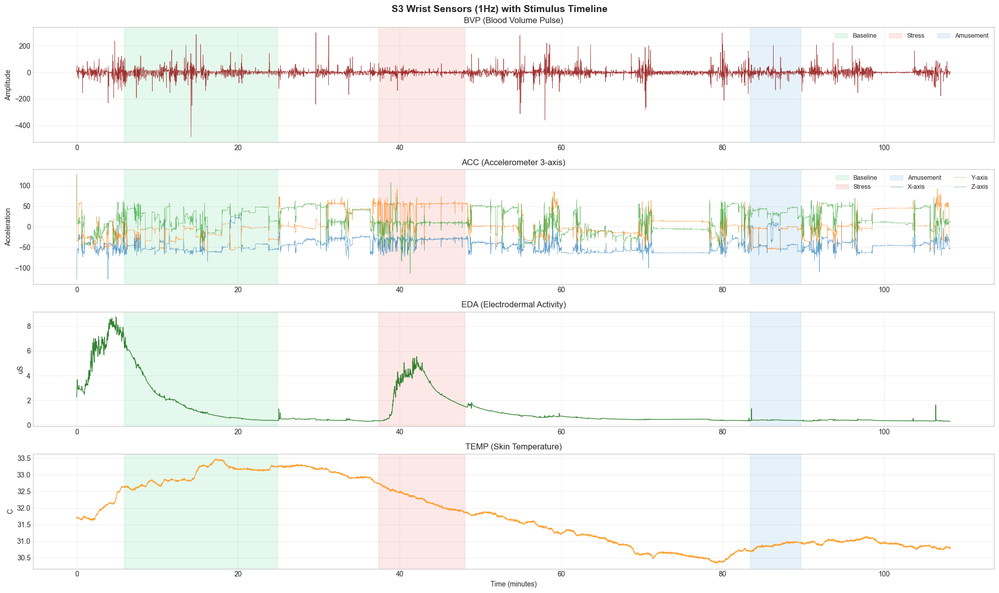

Color legend: Baseline=green, Stress=red, Amusement=blue


In [9]:
plot_subject_wrist("S3")

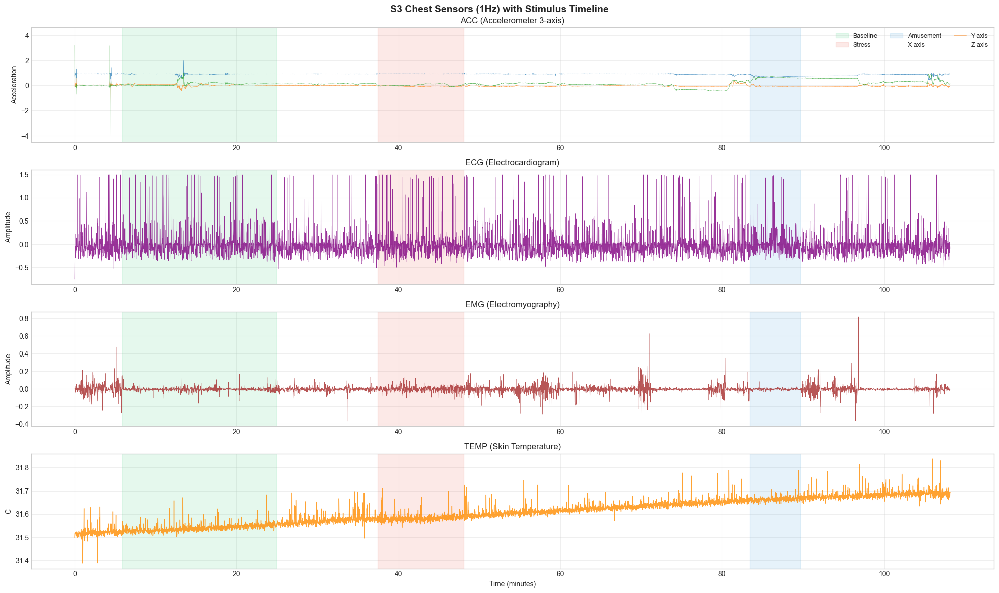

Color legend: Baseline=green, Stress=red, Amusement=blue


In [10]:
plot_subject_chest("S3")

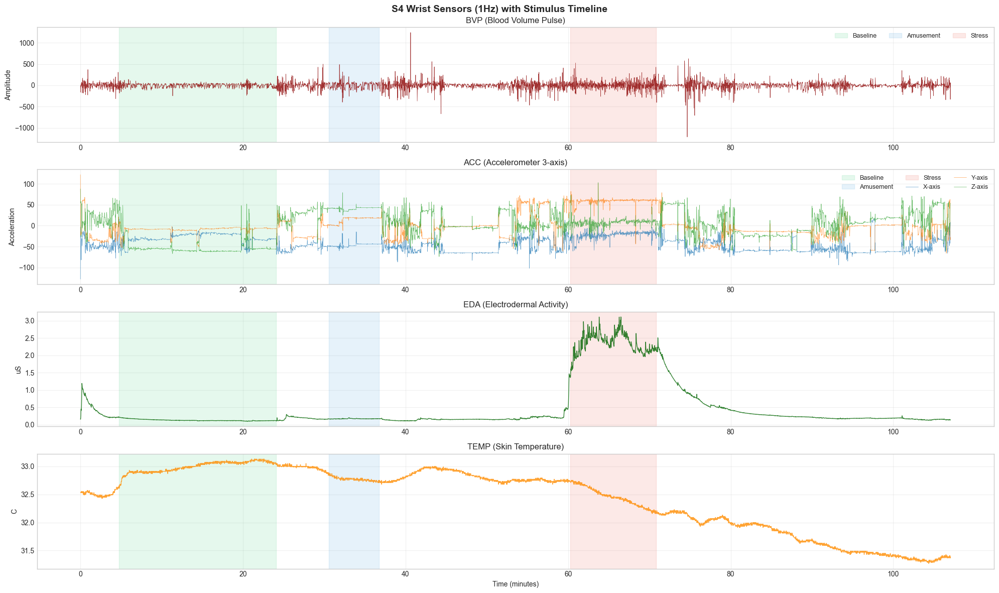

Color legend: Baseline=green, Stress=red, Amusement=blue


In [11]:
plot_subject_wrist("S4")

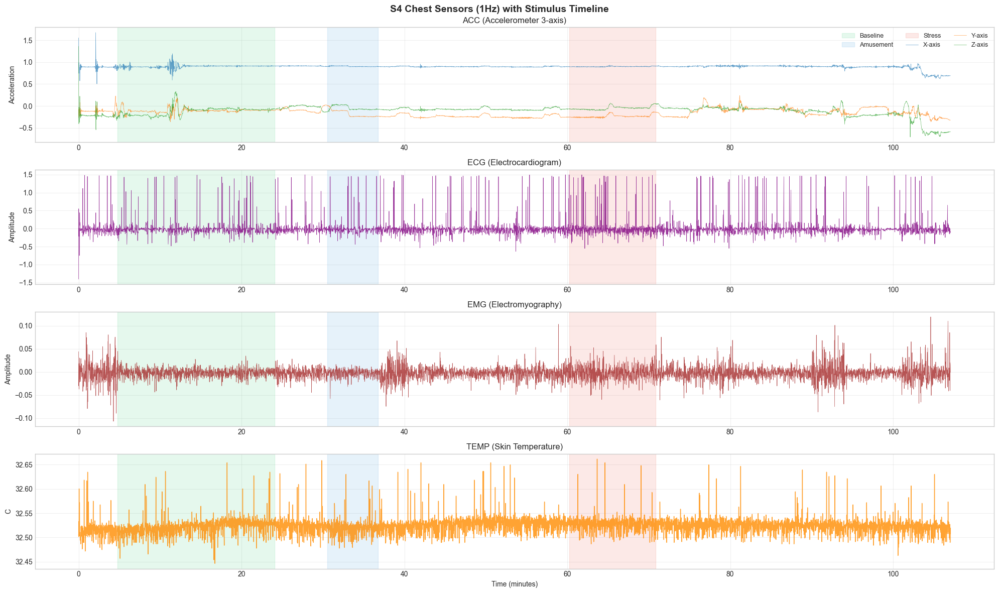

Color legend: Baseline=green, Stress=red, Amusement=blue


In [12]:
plot_subject_chest("S4")

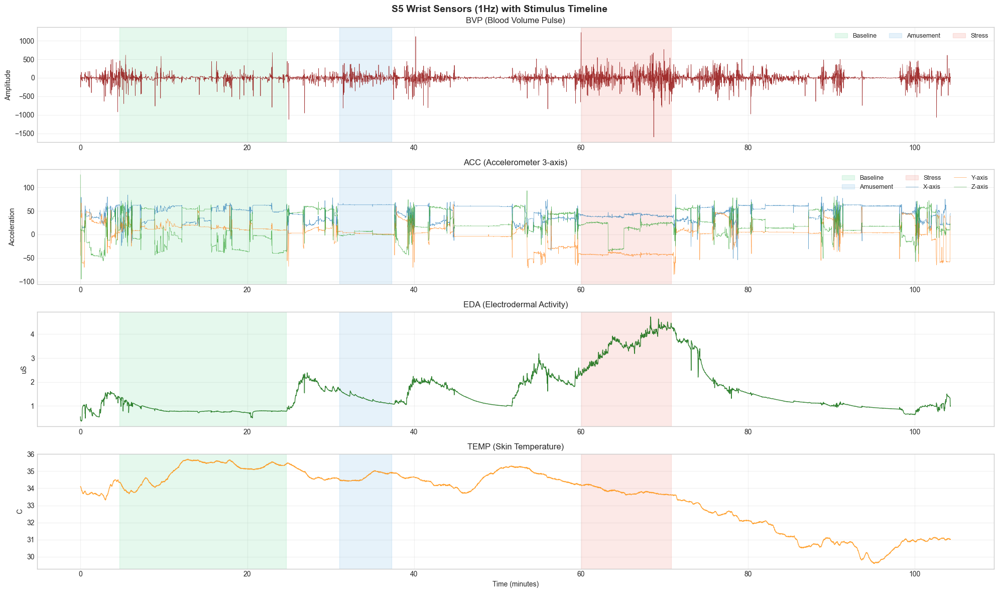

Color legend: Baseline=green, Stress=red, Amusement=blue


In [13]:
plot_subject_wrist("S5")

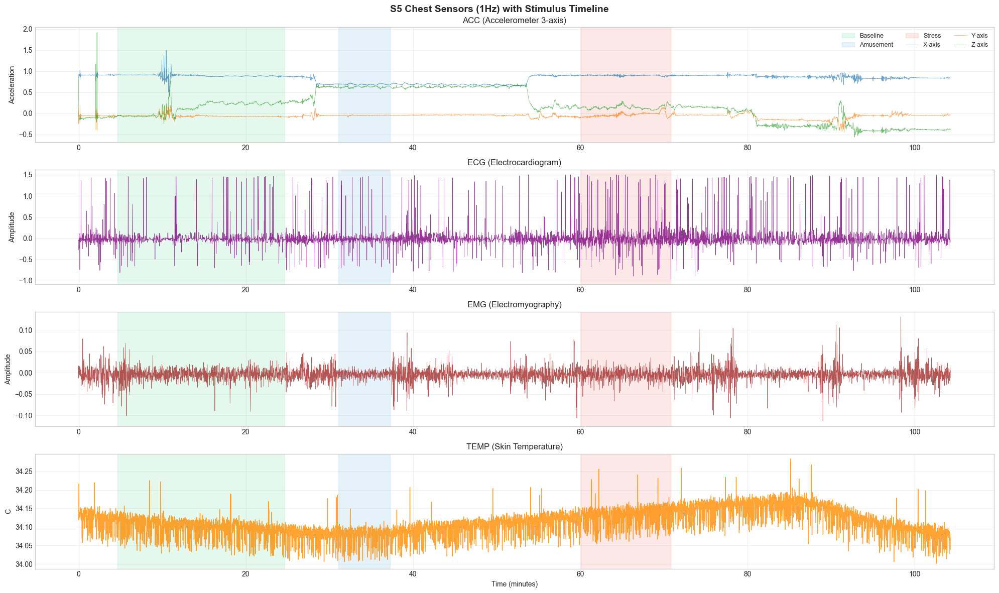

Color legend: Baseline=green, Stress=red, Amusement=blue


In [14]:
plot_subject_chest("S5")

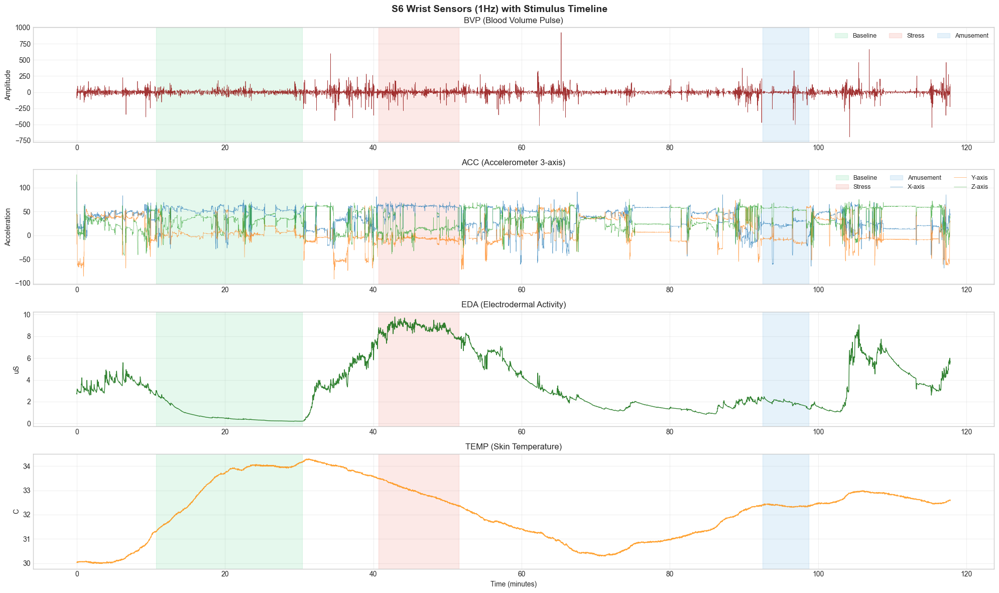

Color legend: Baseline=green, Stress=red, Amusement=blue


In [15]:
plot_subject_wrist("S6")

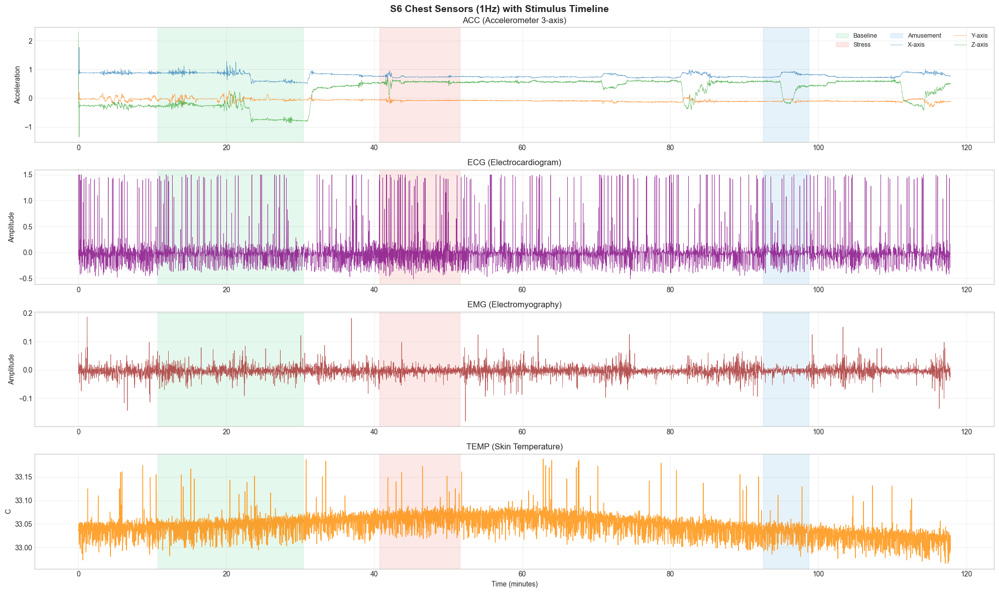

Color legend: Baseline=green, Stress=red, Amusement=blue


In [16]:
plot_subject_chest("S6")

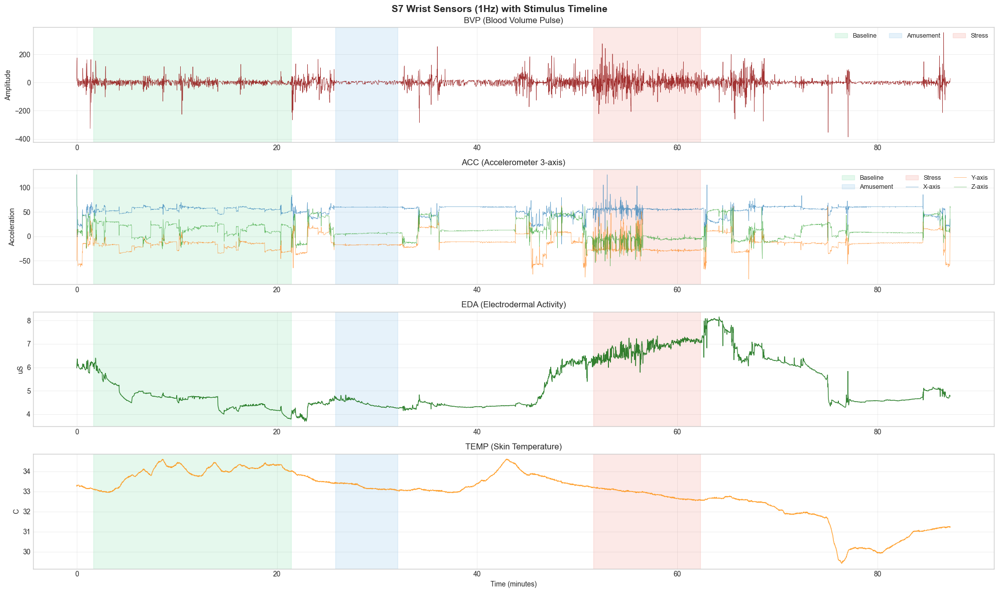

Color legend: Baseline=green, Stress=red, Amusement=blue


In [17]:
plot_subject_wrist("S7")

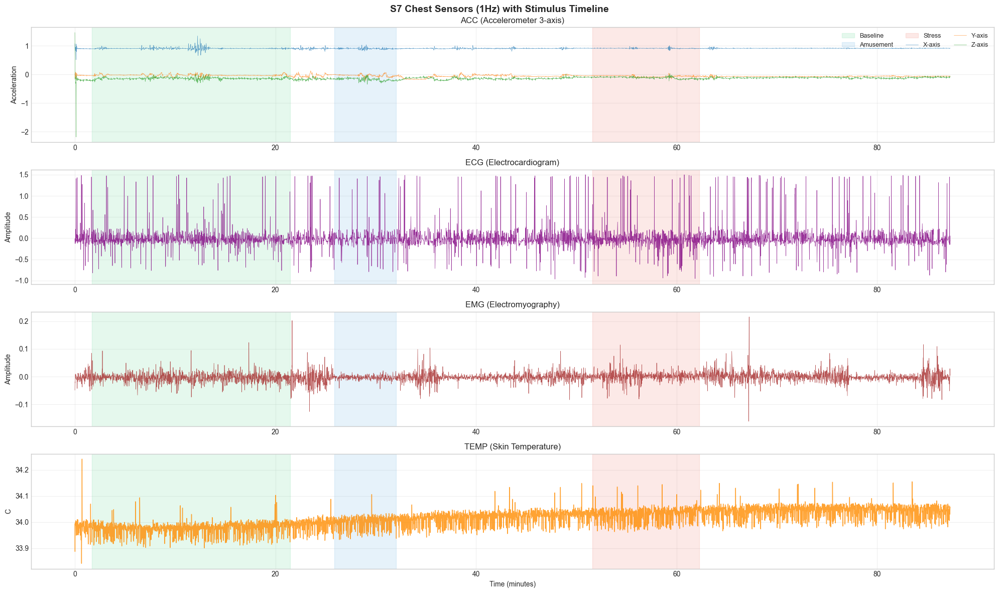

Color legend: Baseline=green, Stress=red, Amusement=blue


In [18]:
plot_subject_chest("S7")

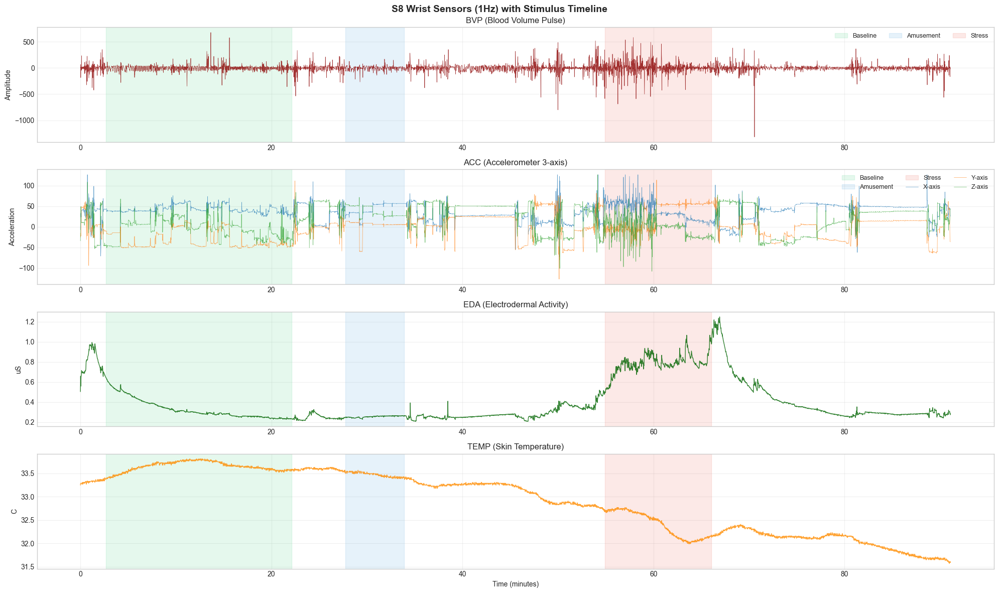

Color legend: Baseline=green, Stress=red, Amusement=blue


In [19]:
plot_subject_wrist("S8")

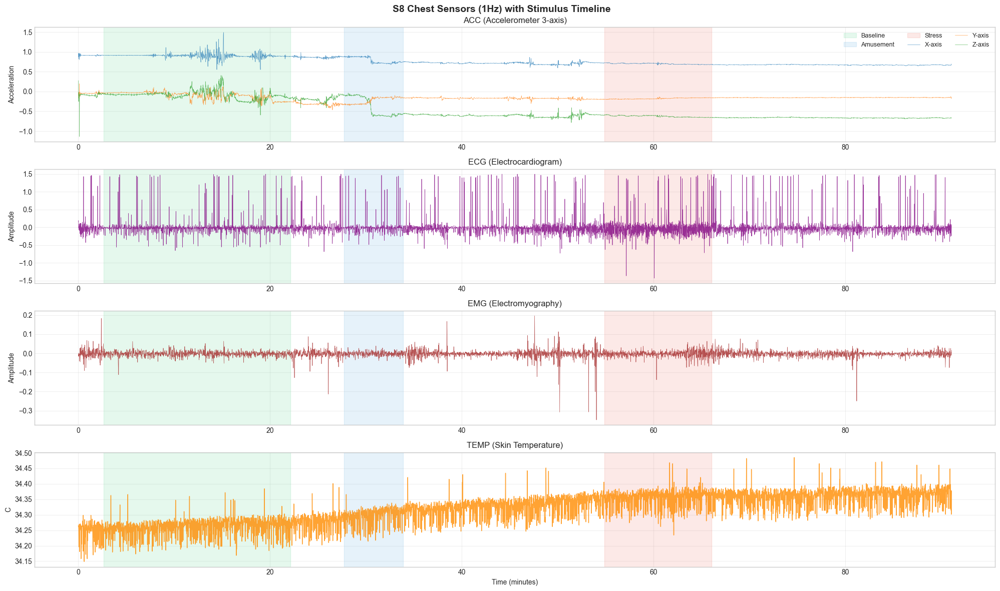

Color legend: Baseline=green, Stress=red, Amusement=blue


In [20]:
plot_subject_chest("S8")

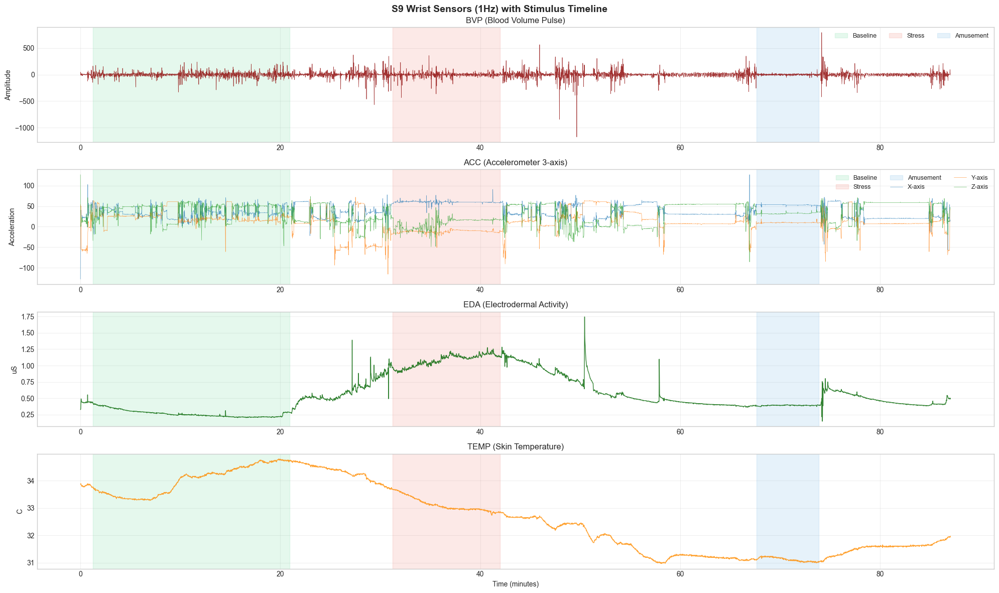

Color legend: Baseline=green, Stress=red, Amusement=blue


In [21]:
plot_subject_wrist("S9")

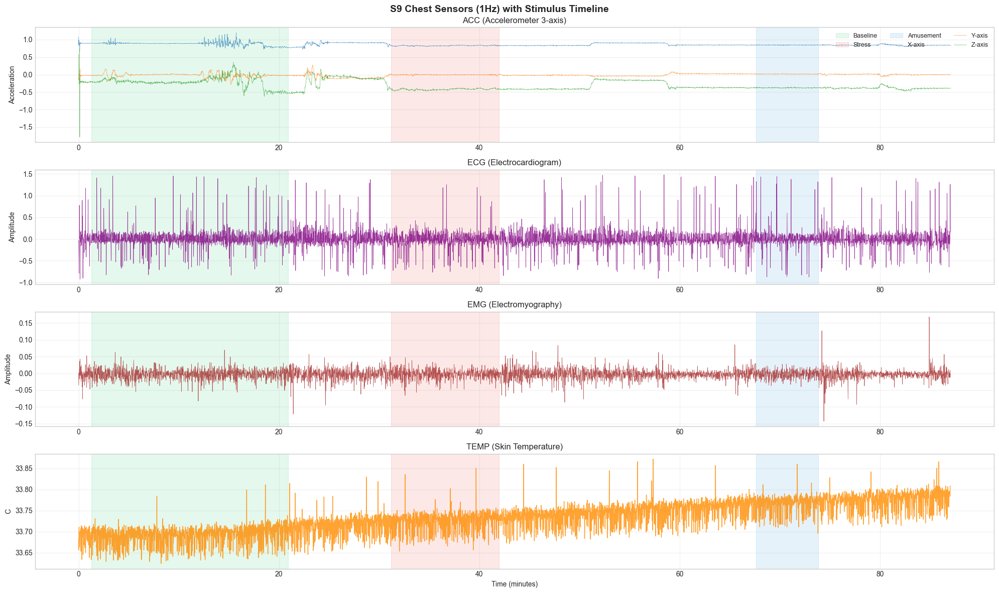

Color legend: Baseline=green, Stress=red, Amusement=blue


In [22]:
plot_subject_chest("S9")

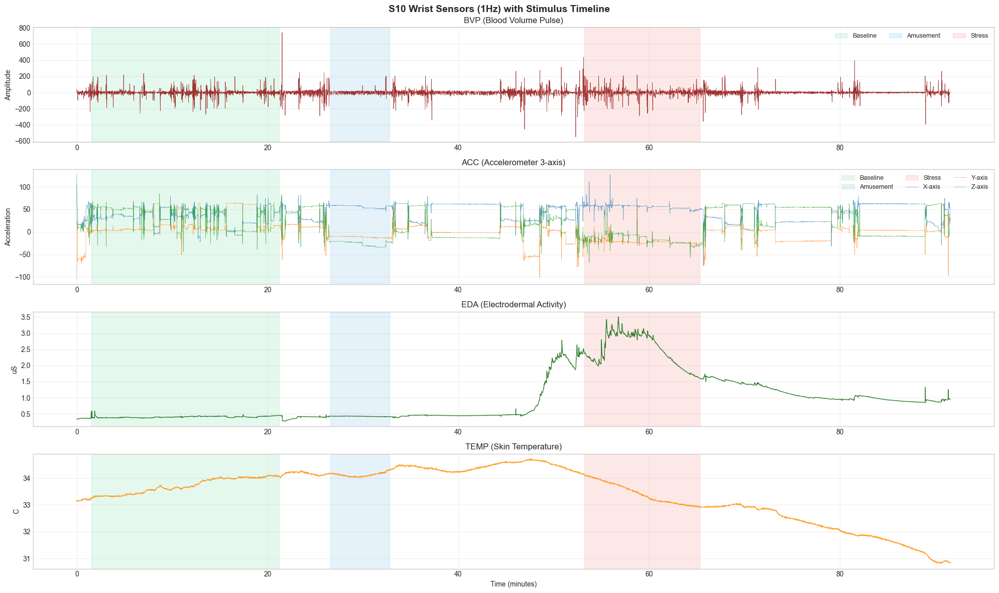

Color legend: Baseline=green, Stress=red, Amusement=blue


In [23]:
plot_subject_wrist("S10")

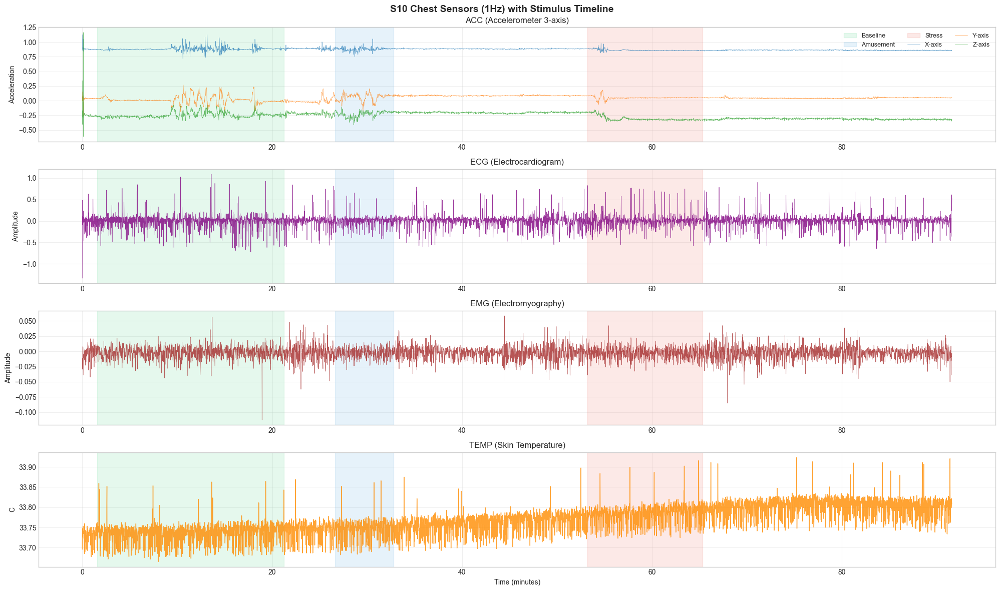

Color legend: Baseline=green, Stress=red, Amusement=blue


In [24]:
plot_subject_chest("S10")

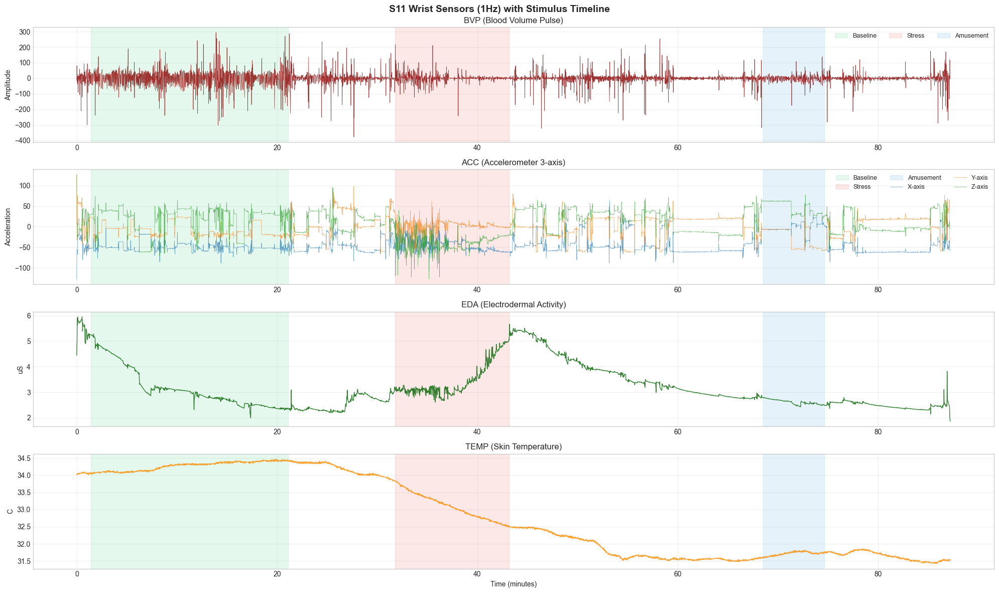

Color legend: Baseline=green, Stress=red, Amusement=blue


In [25]:
plot_subject_wrist("S11")

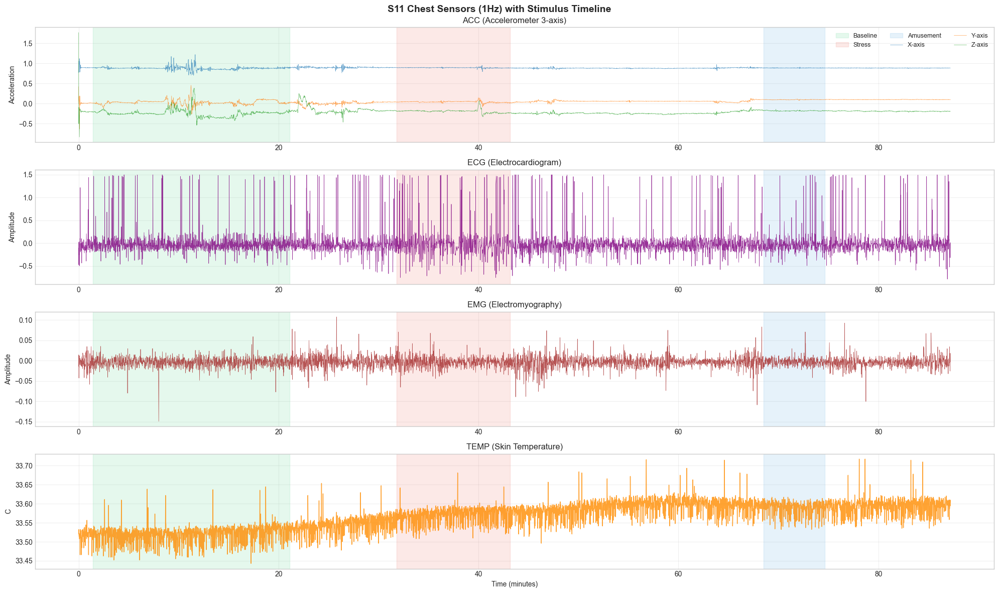

Color legend: Baseline=green, Stress=red, Amusement=blue


In [26]:
plot_subject_chest("S11")

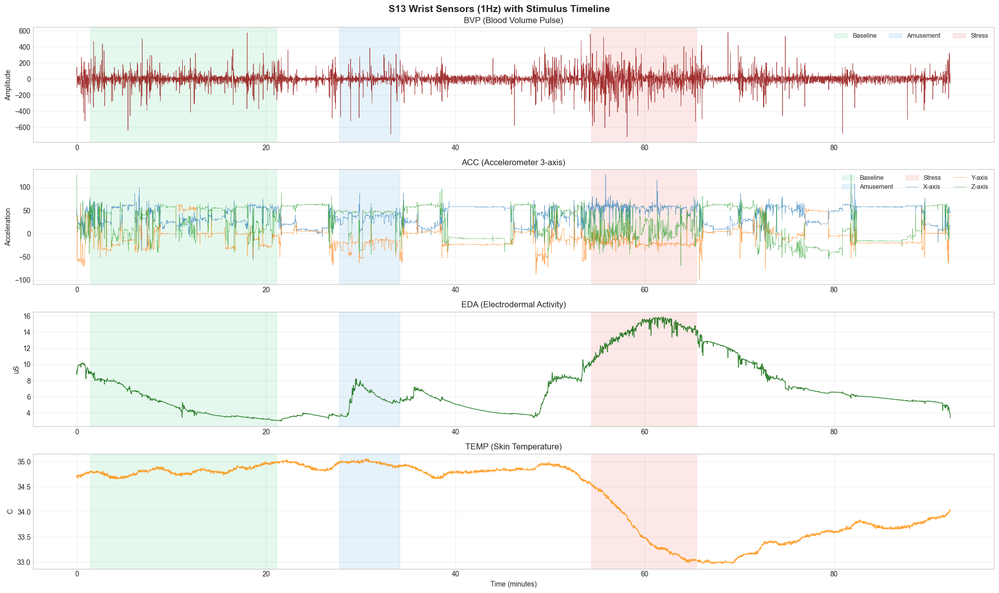

Color legend: Baseline=green, Stress=red, Amusement=blue


In [27]:
plot_subject_wrist("S13")

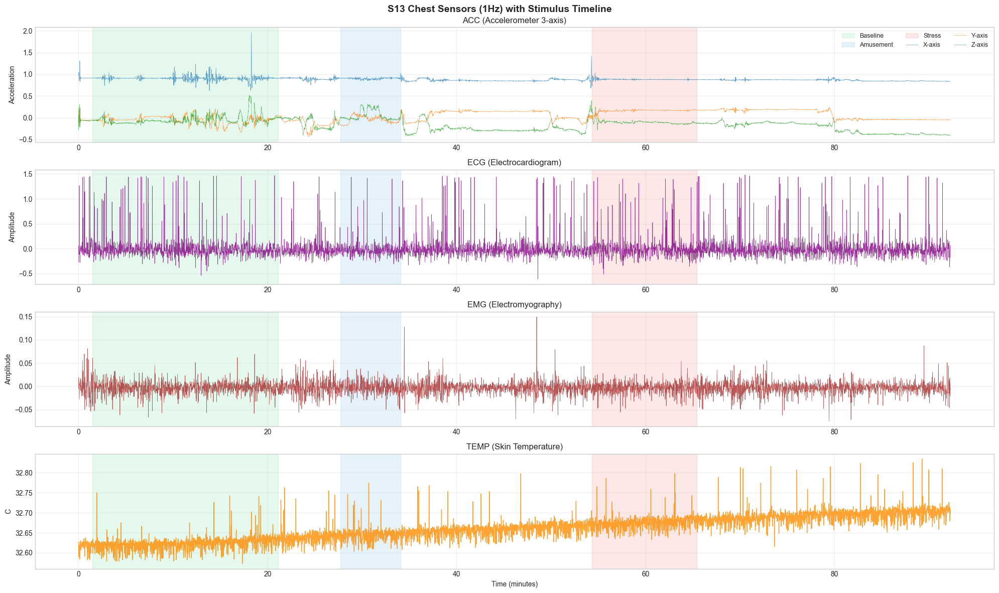

Color legend: Baseline=green, Stress=red, Amusement=blue


In [28]:
plot_subject_chest("S13")

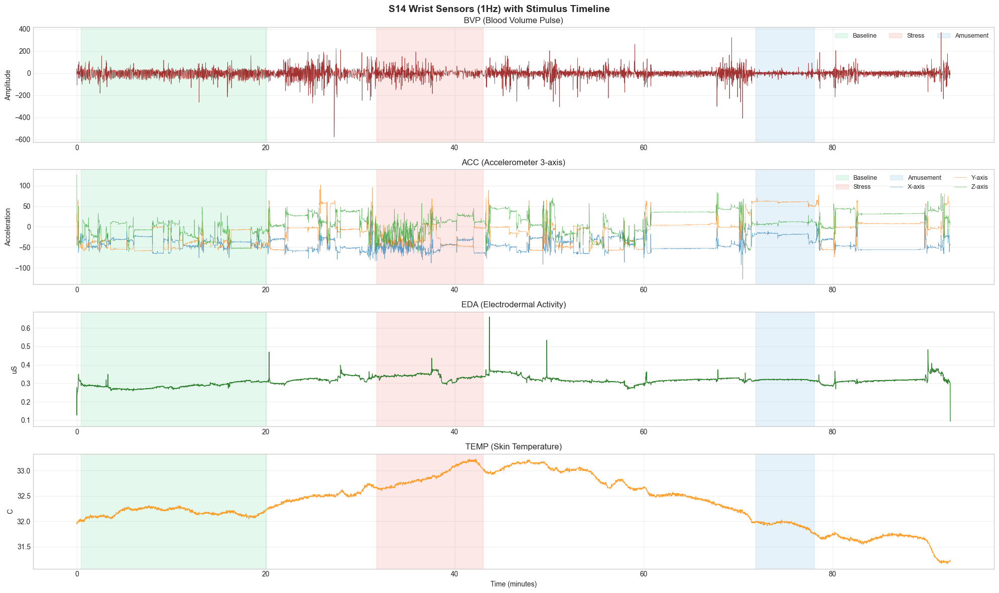

Color legend: Baseline=green, Stress=red, Amusement=blue


In [29]:
plot_subject_wrist("S14")

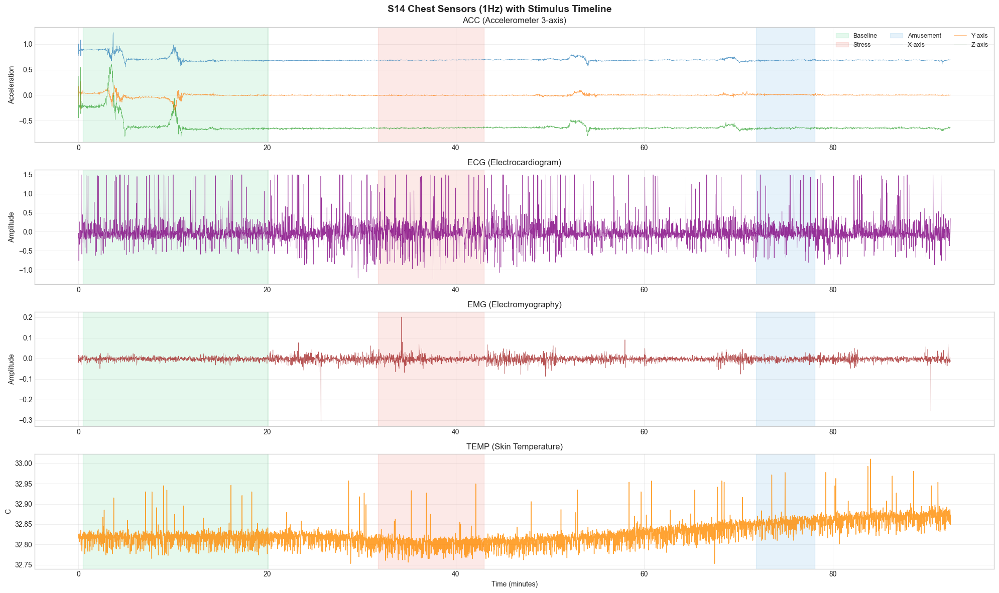

Color legend: Baseline=green, Stress=red, Amusement=blue


In [30]:
plot_subject_chest("S14")

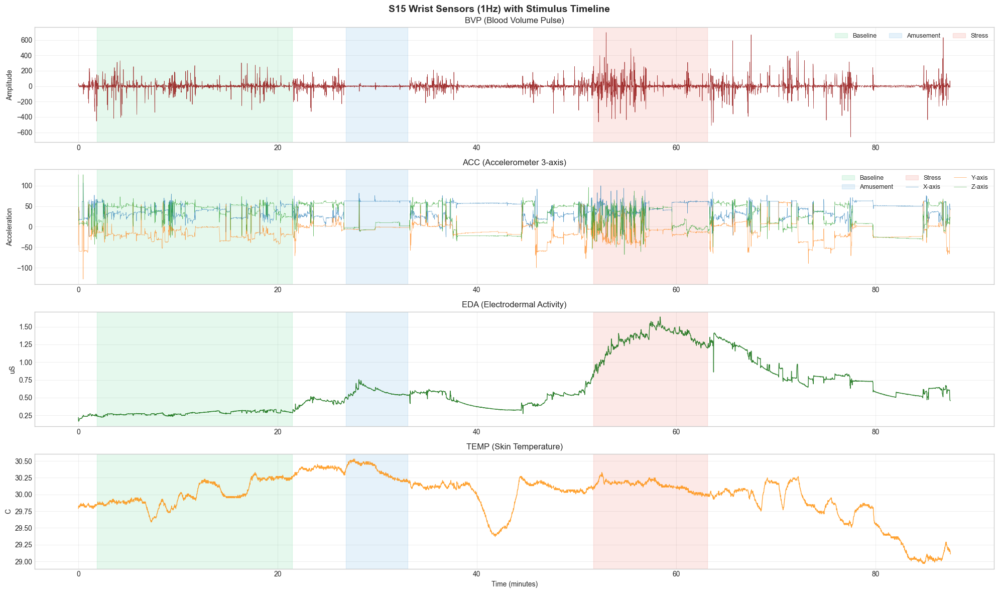

Color legend: Baseline=green, Stress=red, Amusement=blue


In [31]:
plot_subject_wrist("S15")

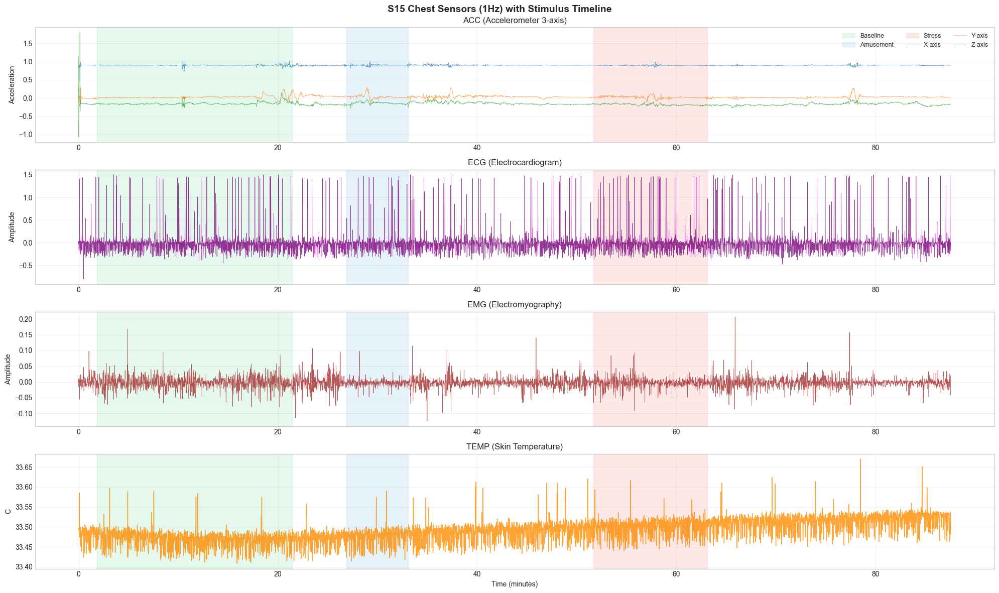

Color legend: Baseline=green, Stress=red, Amusement=blue


In [32]:
plot_subject_chest("S15")

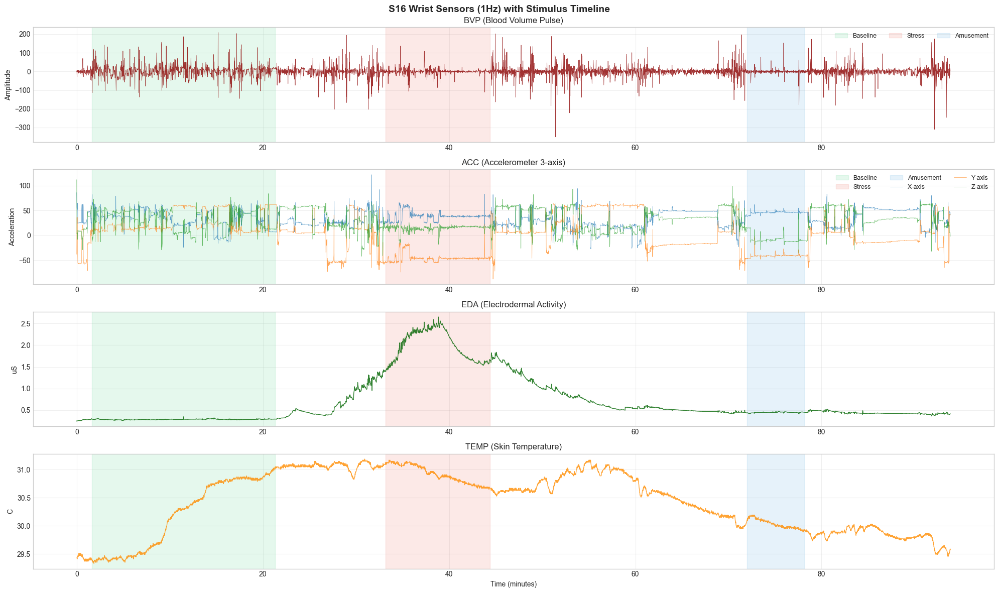

Color legend: Baseline=green, Stress=red, Amusement=blue


In [33]:
plot_subject_wrist("S16")

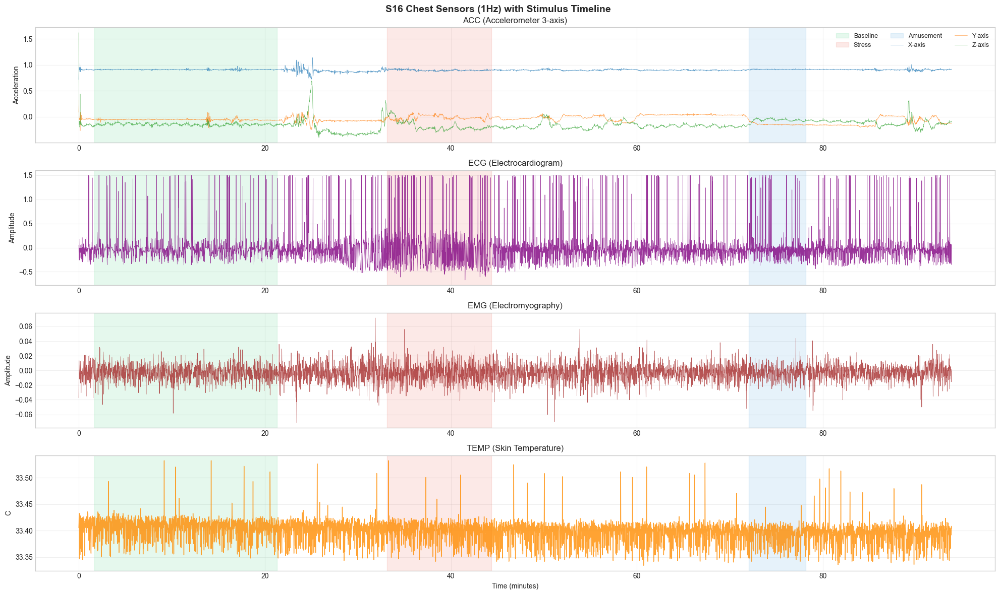

Color legend: Baseline=green, Stress=red, Amusement=blue


In [34]:
plot_subject_chest("S16")

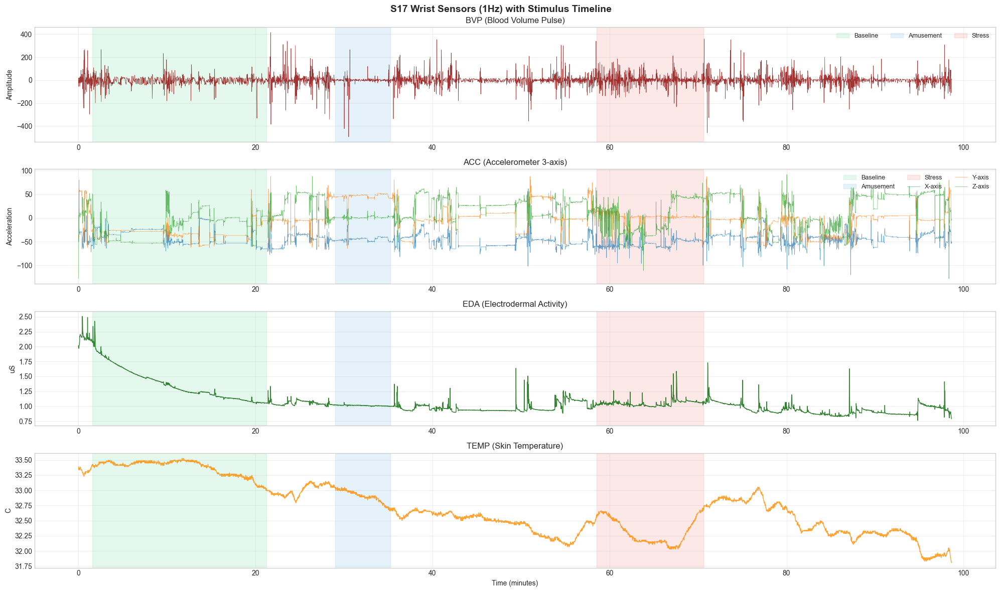

Color legend: Baseline=green, Stress=red, Amusement=blue


In [35]:
plot_subject_wrist("S17")

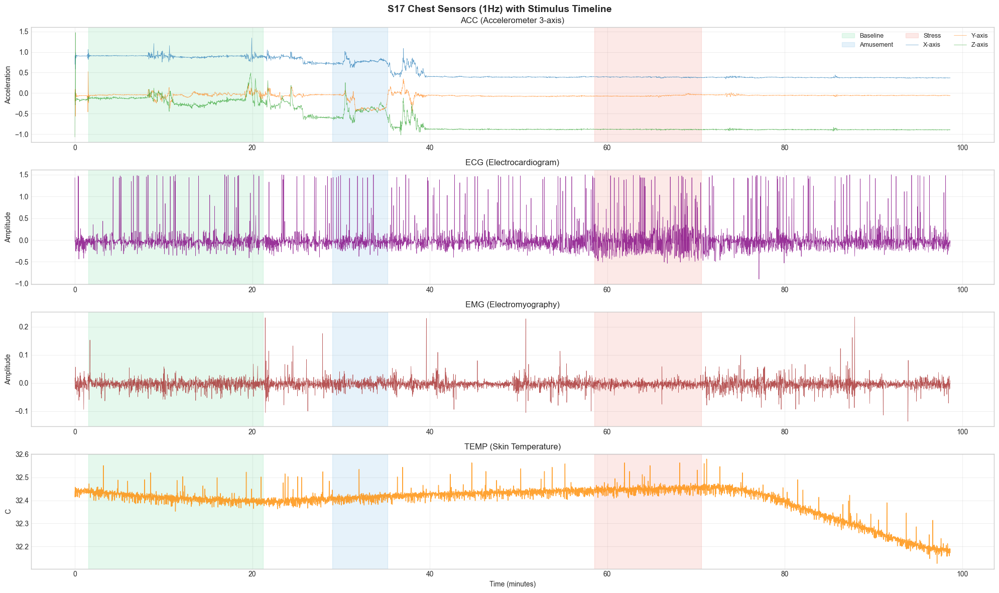

Color legend: Baseline=green, Stress=red, Amusement=blue


In [37]:
plot_subject_chest("S17")